## **Part 3 – CycleGAN: Unpaired Image-to-Image Translation (Apples ↔ Oranges)**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/03.BigDataAnalytics/8.Project3

/content/drive/MyDrive/03.BigDataAnalytics/8.Project3


In [ ]:
import os

# Define dataset path for Apple to Orange
data_dir = "/content/drive/MyDrive/03.BigDataAnalytics/8.Project3/apple2orange"

# List directory structure for Apple and Orange dataset
for folder in ["trainA", "trainB", "testA", "testB"]:
    folder_path = os.path.join(data_dir, folder)
    if os.path.exists(folder_path):
        print(f"{folder} contains {len(os.listdir(folder_path))} files.")
    else:
        print(f"{folder} not found!")

trainA contains 995 files.
trainB contains 1019 files.
testA contains 266 files.
testB contains 248 files.


In [ ]:
import torch
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
import os
from PIL import Image

# Define transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize to 256x256 as required by CycleGAN
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize to [-1, 1]
])

# Define trainA (apples) and trainB (oranges) paths
trainA_path = "/content/drive/MyDrive/03.BigDataAnalytics/8.Project3/apple2orange/trainA"
trainB_path = "/content/drive/MyDrive/03.BigDataAnalytics/8.Project3/apple2orange/trainB"

# Create Dataset class for Apple to Orange
class AppleOrangeDataset(Dataset):
    def __init__(self, pathA, pathB, transform=None):
        self.pathA = [os.path.join(pathA, f) for f in os.listdir(pathA)]
        self.pathB = [os.path.join(pathB, f) for f in os.listdir(pathB)]
        self.transform = transform

    def __len__(self):
        return min(len(self.pathA), len(self.pathB))

    def __getitem__(self, index):
        apple = Image.open(self.pathA[index % len(self.pathA)]).convert('RGB')
        orange = Image.open(self.pathB[index % len(self.pathB)]).convert('RGB')

        if self.transform:
            apple = self.transform(apple)
            orange = self.transform(orange)

        # Return with correct keys: 'apple' and 'orange'
        return {'apple': apple, 'orange': orange}  # Corrected keys

# Load Apple to Orange dataset
dataset = AppleOrangeDataset(trainA_path, trainB_path, transform=transform)

# Create DataLoader
batch_size = 1
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

print(f"Loaded {len(dataset)} apple-orange pairs successfully.")

Loaded 995 apple-orange pairs successfully.


In [ ]:
# -------------------------
# Cell 5: cyclegan_model.py
# -------------------------
%%writefile cyclegan_model.py
import torch
import torch.nn as nn

# ----------------------
#   Generator
# ----------------------
class ResnetBlock(nn.Module):
    """Residual Block with Dropout for CycleGAN"""
    def __init__(self, dim):
        super(ResnetBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(dim, dim, kernel_size=3, stride=1, padding=1, bias=False),
            nn.InstanceNorm2d(dim),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),  # Dropout added to prevent overfitting
            nn.Conv2d(dim, dim, kernel_size=3, stride=1, padding=1, bias=False),
            nn.InstanceNorm2d(dim),
        )

    def forward(self, x):
        return x + self.conv_block(x)


class Generator(nn.Module):
    """Generator: U-Net style ResNet Generator for Apple ↔ Orange"""
    def __init__(self, input_nc, output_nc, num_residual_blocks=9):
        super(Generator, self).__init__()

        # Initial Convolution Block
        model = [
            nn.Conv2d(input_nc, 64, kernel_size=7, stride=1, padding=3, bias=False),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True),
        ]

        # Downsampling
        in_features = 64
        out_features = in_features * 2
        for _ in range(2):
            model += [
                nn.Conv2d(in_features, out_features, kernel_size=3, stride=2, padding=1, bias=False),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True),
            ]
            in_features = out_features
            out_features = in_features * 2

        # Residual Blocks with Dropout
        for _ in range(num_residual_blocks):
            model += [ResnetBlock(in_features)]

        # Upsampling
        out_features = in_features // 2
        for _ in range(2):
            model += [
                nn.ConvTranspose2d(in_features, out_features, kernel_size=3, stride=2, padding=1, output_padding=1, bias=False),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True),
            ]
            in_features = out_features
            out_features = in_features // 2

        # Output Layer
        model += [nn.Conv2d(64, output_nc, kernel_size=7, stride=1, padding=3), nn.Tanh()]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)


# ----------------------
#   Discriminator
# ----------------------
class Discriminator(nn.Module):
    """Discriminator: PatchGAN with 70x70 receptive field for Apple ↔ Orange"""
    def __init__(self, input_nc):
        super(Discriminator, self).__init__()
        model = [
            nn.Conv2d(input_nc, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
        ]
        model += [
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
        ]
        model += [
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
        ]
        model += [
            nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
        ]
        model += [nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1)]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

Overwriting cyclegan_model.py


In [ ]:
# -------------------------
# Cell 6: Initialize Models
# -------------------------
from cyclegan_model import Generator, Discriminator

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define input and output channels
input_nc = 3  # 3 channels for RGB images
output_nc = 3

# Create generator models with corrected names
G_apple2orange = Generator(input_nc, output_nc).to(device)  # Apple -> Orange
G_orange2apple = Generator(input_nc, output_nc).to(device)  # Orange -> Apple

# Create discriminator models
D_apple = Discriminator(input_nc).to(device)  # Discriminator for Apples
D_orange = Discriminator(input_nc).to(device)  # Discriminator for Oranges

print("Models initialized successfully for Apple-to-Orange and Orange-to-Apple tasks!")

Models initialized successfully for Apple-to-Orange and Orange-to-Apple tasks!


In [ ]:
# -------------------------
# Cell 7: Define Losses and Optimizers
# -------------------------
import torch.nn as nn
import torch.nn.functional as F

# Define Losses
adversarial_loss = nn.MSELoss().to(device)  # PatchGAN adversarial loss
cycle_loss = nn.L1Loss().to(device)  # Cycle consistency loss
identity_loss = nn.L1Loss().to(device)  # Identity mapping loss

# Define Optimizers
lr_G = 0.0001  # Lowered learning rate for Generators
lr_D = 0.00005  # Lowered learning rate for Discriminators
beta1, beta2 = 0.5, 0.999

# Optimizer for Generators
optimizer_G = torch.optim.Adam(
    list(G_apple2orange.parameters()) + list(G_orange2apple.parameters()),
    lr=lr_G,
    betas=(beta1, beta2),
)

# Optimizers for Discriminators
optimizer_D_apple = torch.optim.Adam(D_apple.parameters(), lr=lr_D, betas=(beta1, beta2))
optimizer_D_orange = torch.optim.Adam(D_orange.parameters(), lr=lr_D, betas=(beta1, beta2))

print("Losses and optimizers for Apple to Orange defined successfully!")

Losses and optimizers for Apple to Orange defined successfully!


In [ ]:
# -------------------------
# Cell 8: Training Configuration
# -------------------------
import itertools

# Updated Training parameters
num_epochs = 250  # Increased epochs to 250 for better results
batch_size = 1  # CycleGAN typically uses batch size of 1
lambda_cycle = 10  # Weight for cycle consistency loss
lambda_identity = 5  # Weight for identity mapping loss
print_every = 10  # Print updates every 10 epochs

# Define real and fake labels for PatchGAN
def create_target_tensors(real, target_shape):
    """Create tensors for real (1s) or fake (0s) labels."""
    if real:
        return torch.ones(target_shape, device=device)
    else:
        return torch.zeros(target_shape, device=device)

# Replay buffer for generated images to reduce mode collapse
class ReplayBuffer:
    def __init__(self, max_size=50):
        assert max_size > 0, "Buffer size should be greater than 0."
        self.max_size = max_size
        self.data = []

    def push_and_pop(self, data):
        """Push new data and pop old data for replay buffer."""
        to_return = []
        for element in data:
            element = element.unsqueeze(0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if np.random.uniform(0, 1) > 0.5:
                    i = np.random.randint(0, self.max_size)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return torch.cat(to_return, 0)


# Replay buffers updated for Apple to Orange
fake_orange_buffer = ReplayBuffer()
fake_apple_buffer = ReplayBuffer()

print("Training configuration for Apple to Orange completed!")

Training configuration for Apple to Orange completed!


Starting from epoch 1...
Starting/Resuming Training...
Training: Currently on Epoch 1/250...
Training: Currently on Epoch 2/250...
Training: Currently on Epoch 3/250...
Training: Currently on Epoch 4/250...
Training: Currently on Epoch 5/250...
Training: Currently on Epoch 6/250...
Training: Currently on Epoch 7/250...
Training: Currently on Epoch 8/250...
Training: Currently on Epoch 9/250...
Training: Currently on Epoch 10/250...


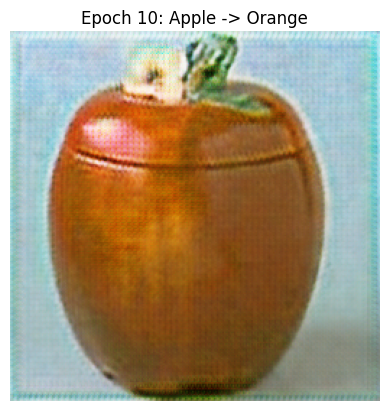

Training: Currently on Epoch 11/250...
Training: Currently on Epoch 12/250...
Training: Currently on Epoch 13/250...
Training: Currently on Epoch 14/250...
Training: Currently on Epoch 15/250...
Training: Currently on Epoch 16/250...
Training: Currently on Epoch 17/250...
Training: Currently on Epoch 18/250...
Training: Currently on Epoch 19/250...
Training: Currently on Epoch 20/250...


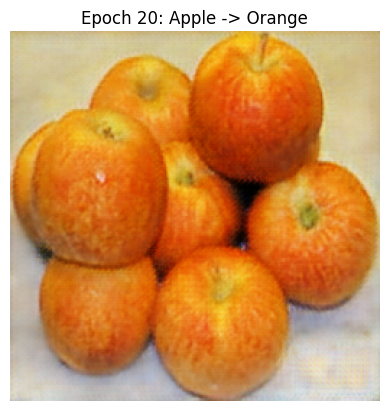

 Models saved at epoch 20
Training: Currently on Epoch 21/250...
Training: Currently on Epoch 22/250...
Training: Currently on Epoch 23/250...
Training: Currently on Epoch 24/250...
Training: Currently on Epoch 25/250...
Training: Currently on Epoch 26/250...
Training: Currently on Epoch 27/250...
Training: Currently on Epoch 28/250...
Training: Currently on Epoch 29/250...
Training: Currently on Epoch 30/250...


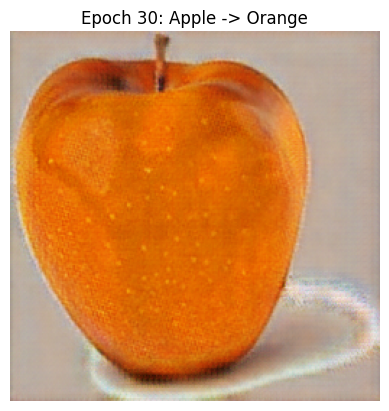

Training: Currently on Epoch 31/250...
Training: Currently on Epoch 32/250...
Training: Currently on Epoch 33/250...
Training: Currently on Epoch 34/250...
Training: Currently on Epoch 35/250...
Training: Currently on Epoch 36/250...
Training: Currently on Epoch 37/250...
Training: Currently on Epoch 38/250...
Training: Currently on Epoch 39/250...
Training: Currently on Epoch 40/250...


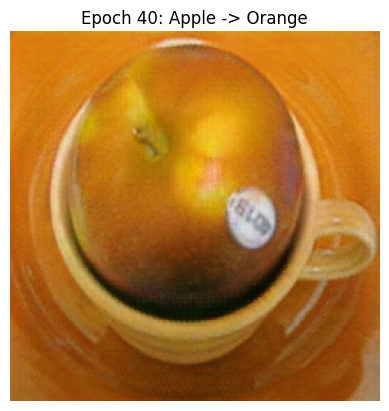

 Models saved at epoch 40
Training: Currently on Epoch 41/250...
Training: Currently on Epoch 42/250...
Training: Currently on Epoch 43/250...
Training: Currently on Epoch 44/250...
Training: Currently on Epoch 45/250...
Training: Currently on Epoch 46/250...
Training: Currently on Epoch 47/250...
Training: Currently on Epoch 48/250...
Training: Currently on Epoch 49/250...
Training: Currently on Epoch 50/250...


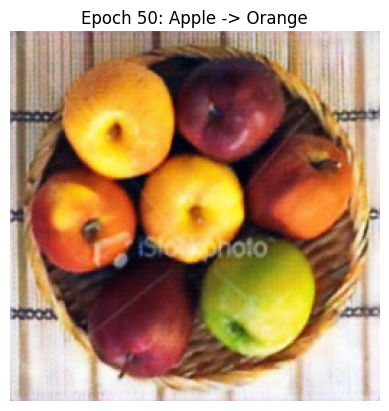

Training: Currently on Epoch 51/250...
Training: Currently on Epoch 52/250...
Training: Currently on Epoch 53/250...
Training: Currently on Epoch 54/250...
Training: Currently on Epoch 55/250...
Training: Currently on Epoch 56/250...
Training: Currently on Epoch 57/250...
Training: Currently on Epoch 58/250...
Training: Currently on Epoch 59/250...
Training: Currently on Epoch 60/250...


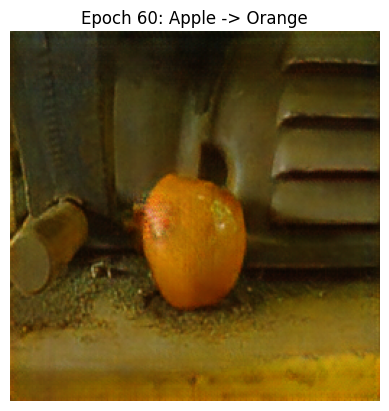

 Models saved at epoch 60
Training: Currently on Epoch 61/250...
Training: Currently on Epoch 62/250...
Training: Currently on Epoch 63/250...
Training: Currently on Epoch 64/250...
Training: Currently on Epoch 65/250...
Training: Currently on Epoch 66/250...
Training: Currently on Epoch 67/250...
Training: Currently on Epoch 68/250...
Training: Currently on Epoch 69/250...
Training: Currently on Epoch 70/250...


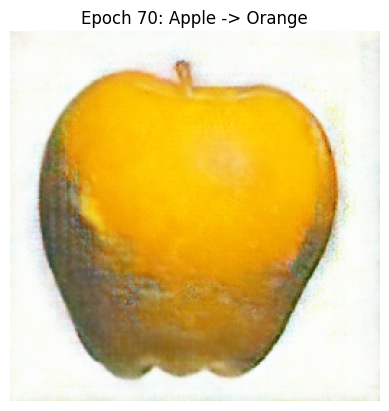

Training: Currently on Epoch 71/250...
Training: Currently on Epoch 72/250...
Training: Currently on Epoch 73/250...
Training: Currently on Epoch 74/250...
Training: Currently on Epoch 75/250...
Training: Currently on Epoch 76/250...
Training: Currently on Epoch 77/250...
Training: Currently on Epoch 78/250...
Training: Currently on Epoch 79/250...
Training: Currently on Epoch 80/250...


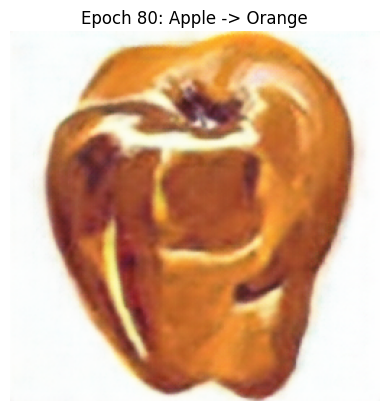

 Models saved at epoch 80
Training: Currently on Epoch 81/250...
Training: Currently on Epoch 82/250...
Training: Currently on Epoch 83/250...
Training: Currently on Epoch 84/250...
Training: Currently on Epoch 85/250...
Training: Currently on Epoch 86/250...
Training: Currently on Epoch 87/250...
Training: Currently on Epoch 88/250...
Training: Currently on Epoch 89/250...
Training: Currently on Epoch 90/250...


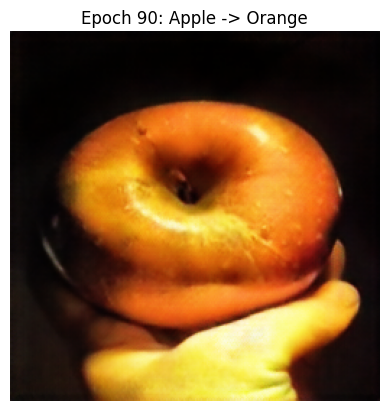

Training: Currently on Epoch 91/250...
Training: Currently on Epoch 92/250...
Training: Currently on Epoch 93/250...
Training: Currently on Epoch 94/250...
Training: Currently on Epoch 95/250...
Training: Currently on Epoch 96/250...
Training: Currently on Epoch 97/250...
Training: Currently on Epoch 98/250...
Training: Currently on Epoch 99/250...
Training: Currently on Epoch 100/250...


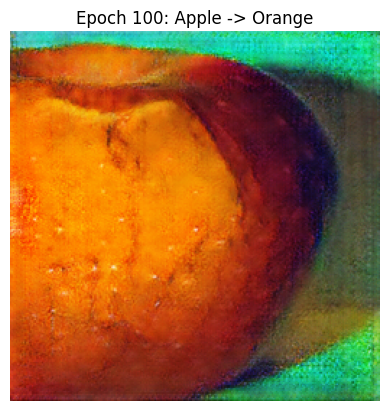

 Models saved at epoch 100
Training: Currently on Epoch 101/250...
Training: Currently on Epoch 102/250...
Training: Currently on Epoch 103/250...
Training: Currently on Epoch 104/250...
Training: Currently on Epoch 105/250...
Training: Currently on Epoch 106/250...
Training: Currently on Epoch 107/250...
Training: Currently on Epoch 108/250...
Training: Currently on Epoch 109/250...
Training: Currently on Epoch 110/250...


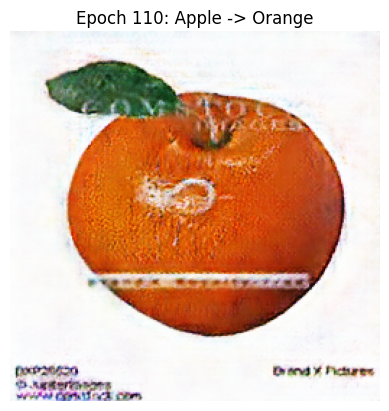

Training: Currently on Epoch 111/250...
Training: Currently on Epoch 112/250...
Training: Currently on Epoch 113/250...
Training: Currently on Epoch 114/250...
Training: Currently on Epoch 115/250...
Training: Currently on Epoch 116/250...
Training: Currently on Epoch 117/250...
Training: Currently on Epoch 118/250...
Training: Currently on Epoch 119/250...
Training: Currently on Epoch 120/250...


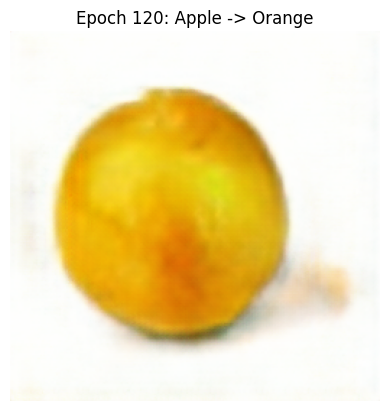

 Models saved at epoch 120
Training: Currently on Epoch 121/250...
Training: Currently on Epoch 122/250...
Training: Currently on Epoch 123/250...
Training: Currently on Epoch 124/250...
Training: Currently on Epoch 125/250...
Training: Currently on Epoch 126/250...
Training: Currently on Epoch 127/250...
Training: Currently on Epoch 128/250...
Training: Currently on Epoch 129/250...
Training: Currently on Epoch 130/250...


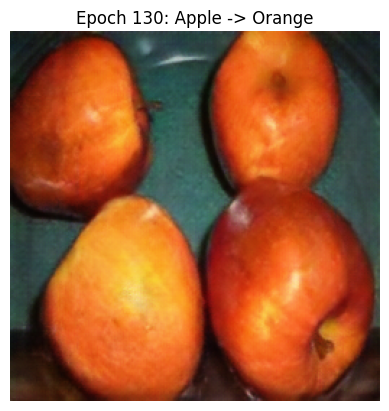

Training: Currently on Epoch 131/250...
Training: Currently on Epoch 132/250...
Training: Currently on Epoch 133/250...
Training: Currently on Epoch 134/250...
Training: Currently on Epoch 135/250...
Training: Currently on Epoch 136/250...
Training: Currently on Epoch 137/250...
Training: Currently on Epoch 138/250...
Training: Currently on Epoch 139/250...
Training: Currently on Epoch 140/250...


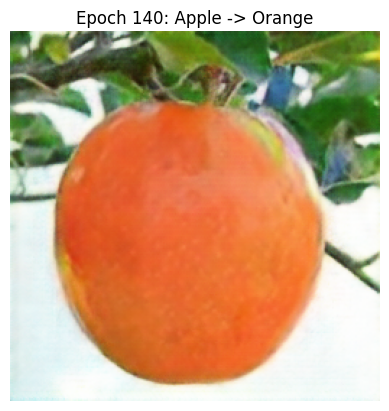

 Models saved at epoch 140
Training: Currently on Epoch 141/250...
Training: Currently on Epoch 142/250...
Training: Currently on Epoch 143/250...
Training: Currently on Epoch 144/250...
Training: Currently on Epoch 145/250...
Training: Currently on Epoch 146/250...
Training: Currently on Epoch 147/250...
Training: Currently on Epoch 148/250...
Training: Currently on Epoch 149/250...
Training: Currently on Epoch 150/250...


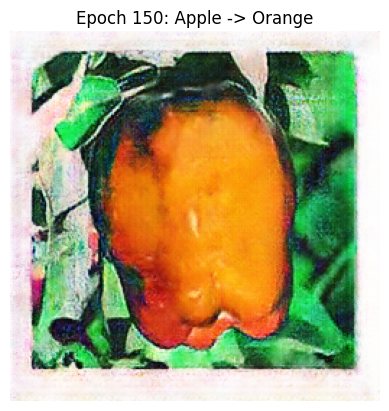

Training: Currently on Epoch 151/250...
Training: Currently on Epoch 152/250...
Training: Currently on Epoch 153/250...
Training: Currently on Epoch 154/250...
Training: Currently on Epoch 155/250...
Training: Currently on Epoch 156/250...
Training: Currently on Epoch 157/250...
Training: Currently on Epoch 158/250...
Training: Currently on Epoch 159/250...
Training: Currently on Epoch 160/250...


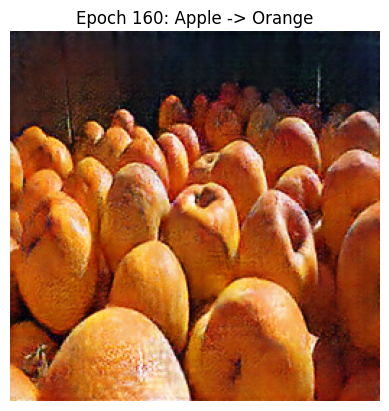

 Models saved at epoch 160
Training: Currently on Epoch 161/250...
Training: Currently on Epoch 162/250...
Training: Currently on Epoch 163/250...
Training: Currently on Epoch 164/250...
Training: Currently on Epoch 165/250...
Training: Currently on Epoch 166/250...
Training: Currently on Epoch 167/250...
Training: Currently on Epoch 168/250...
Training: Currently on Epoch 169/250...
Training: Currently on Epoch 170/250...


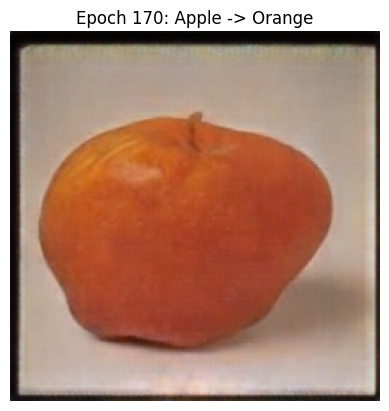

Training: Currently on Epoch 171/250...
Training: Currently on Epoch 172/250...
Training: Currently on Epoch 173/250...
Training: Currently on Epoch 174/250...
Training: Currently on Epoch 175/250...
Training: Currently on Epoch 176/250...
Training: Currently on Epoch 177/250...
Training: Currently on Epoch 178/250...
Training: Currently on Epoch 179/250...
Training: Currently on Epoch 180/250...


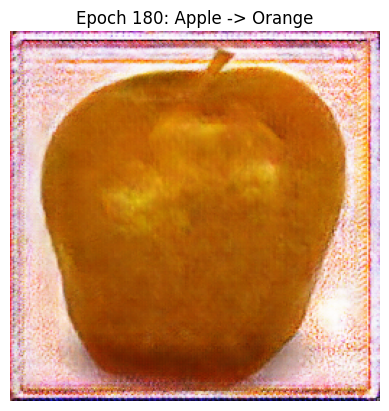

 Models saved at epoch 180
Training: Currently on Epoch 181/250...
Training: Currently on Epoch 182/250...
Training: Currently on Epoch 183/250...
Training: Currently on Epoch 184/250...
Training: Currently on Epoch 185/250...
Training: Currently on Epoch 186/250...
Training: Currently on Epoch 187/250...
Training: Currently on Epoch 188/250...
Training: Currently on Epoch 189/250...
Training: Currently on Epoch 190/250...


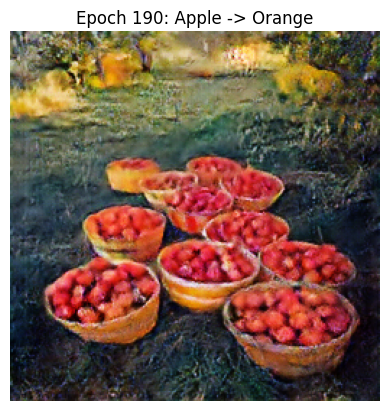

Training: Currently on Epoch 191/250...
Training: Currently on Epoch 192/250...
Training: Currently on Epoch 193/250...
Training: Currently on Epoch 194/250...
Training: Currently on Epoch 195/250...
Training: Currently on Epoch 196/250...
Training: Currently on Epoch 197/250...
Training: Currently on Epoch 198/250...
Training: Currently on Epoch 199/250...
Training: Currently on Epoch 200/250...


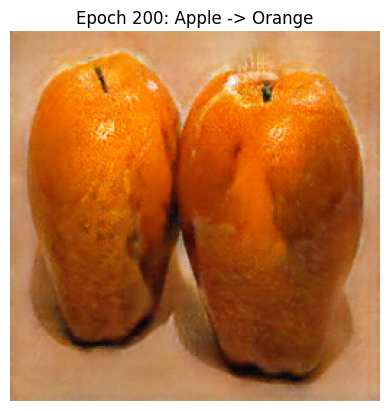

 Models saved at epoch 200
Training: Currently on Epoch 201/250...
Training: Currently on Epoch 202/250...
Training: Currently on Epoch 203/250...
Training: Currently on Epoch 204/250...
Training: Currently on Epoch 205/250...
Training: Currently on Epoch 206/250...
Training: Currently on Epoch 207/250...
Training: Currently on Epoch 208/250...
Training: Currently on Epoch 209/250...
Training: Currently on Epoch 210/250...


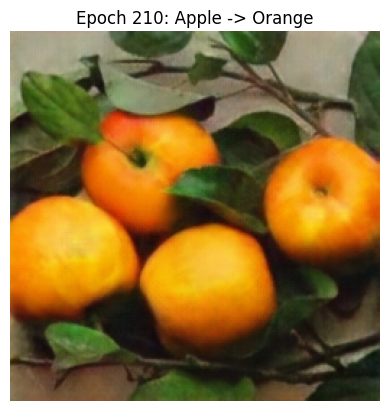

Training: Currently on Epoch 211/250...
Training: Currently on Epoch 212/250...
Training: Currently on Epoch 213/250...
Training: Currently on Epoch 214/250...
Training: Currently on Epoch 215/250...
Training: Currently on Epoch 216/250...
Training: Currently on Epoch 217/250...
Training: Currently on Epoch 218/250...
Training: Currently on Epoch 219/250...
Training: Currently on Epoch 220/250...


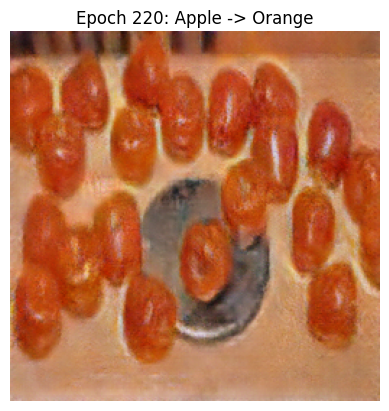

 Models saved at epoch 220
Training: Currently on Epoch 221/250...
Training: Currently on Epoch 222/250...
Training: Currently on Epoch 223/250...
Training: Currently on Epoch 224/250...
Training: Currently on Epoch 225/250...
Training: Currently on Epoch 226/250...
Training: Currently on Epoch 227/250...
Training: Currently on Epoch 228/250...
Training: Currently on Epoch 229/250...
Training: Currently on Epoch 230/250...


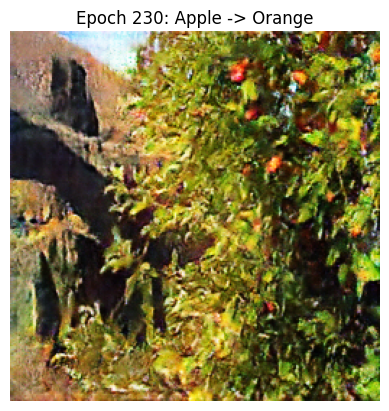

Training: Currently on Epoch 231/250...
Training: Currently on Epoch 232/250...
Training: Currently on Epoch 233/250...
Training: Currently on Epoch 234/250...
Training: Currently on Epoch 235/250...
Training: Currently on Epoch 236/250...
Training: Currently on Epoch 237/250...
Training: Currently on Epoch 238/250...
Training: Currently on Epoch 239/250...
Training: Currently on Epoch 240/250...


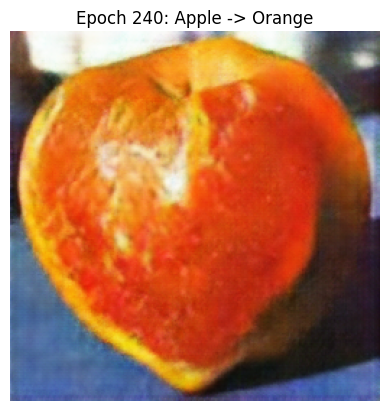

 Models saved at epoch 240
Training: Currently on Epoch 241/250...
Training: Currently on Epoch 242/250...
Training: Currently on Epoch 243/250...
Training: Currently on Epoch 244/250...
Training: Currently on Epoch 245/250...
Training: Currently on Epoch 246/250...
Training: Currently on Epoch 247/250...
Training: Currently on Epoch 248/250...
Training: Currently on Epoch 249/250...
Training: Currently on Epoch 250/250...


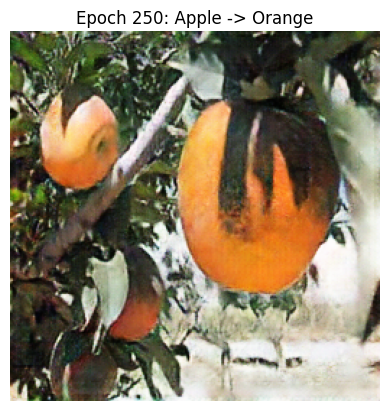

Training Complete!


In [ ]:
# -------------------------
# Cell 9: Training Loop and Checkpoint Handling
# -------------------------
import os
import re
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms

# Paths to saved models
checkpoint_dir = "/content/drive/MyDrive/03.BigDataAnalytics/8.Project3/"

# ----------------------------
# Define Starting Epoch (Modify as Needed)
# ----------------------------
# Set this variable to 1 to start from scratch, or specify a custom epoch to resume
start_epoch = 1  # Set this to 1 for fresh training, or specify an epoch number like 100

# ----------------------------
# Check for the latest epoch only if start_epoch > 1
# ----------------------------
last_saved_epoch = 0

if start_epoch > 1:
    file_pattern = re.compile(r"G_apple2orange_epoch_(\d+)\.pt")

    for file in os.listdir(checkpoint_dir):
        match = file_pattern.match(file)
        if match:
            epoch_number = int(match.group(1))
            if epoch_number == start_epoch - 1:  # Look for the exact epoch checkpoint
                last_saved_epoch = epoch_number

if last_saved_epoch > 0:
    print(f"Loading models from epoch {last_saved_epoch}...")
    G_apple2orange.load_state_dict(
        torch.load(f"{checkpoint_dir}/G_apple2orange_epoch_{last_saved_epoch}.pt")
    )
    G_orange2apple.load_state_dict(
        torch.load(f"{checkpoint_dir}/G_orange2apple_epoch_{last_saved_epoch}.pt")
    )
    print(f"Models loaded successfully from epoch {last_saved_epoch}")
else:
    print(f"Starting from epoch {start_epoch}...")

# Training Loop (resumes correctly!)
print("Starting/Resuming Training...")

for epoch in range(start_epoch - 1, num_epochs):
    print(f"Training: Currently on Epoch {epoch + 1}/{num_epochs}...")

    for i, batch in enumerate(dataloader):
        real_apple = batch['apple'].to(device)
        real_orange = batch['orange'].to(device)

        # ---------------------
        #  Train Generators
        # ---------------------
        optimizer_G.zero_grad()

        fake_orange = G_apple2orange(real_apple)
        reconstructed_apple = G_orange2apple(fake_orange)
        fake_apple = G_orange2apple(real_orange)
        reconstructed_orange = G_apple2orange(fake_apple)

        id_apple = G_orange2apple(real_apple)
        id_orange = G_apple2orange(real_orange)

        loss_identity_apple = identity_loss(id_apple, real_apple) * lambda_identity
        loss_identity_orange = identity_loss(id_orange, real_orange) * lambda_identity

        loss_G_apple2orange = adversarial_loss(D_orange(fake_orange), create_target_tensors(True, D_orange(fake_orange).shape))
        loss_G_orange2apple = adversarial_loss(D_apple(fake_apple), create_target_tensors(True, D_apple(fake_apple).shape))

        loss_cycle_apple = cycle_loss(reconstructed_apple, real_apple) * lambda_cycle
        loss_cycle_orange = cycle_loss(reconstructed_orange, real_orange) * lambda_cycle

        loss_G = (
            loss_G_apple2orange + loss_G_orange2apple
            + loss_cycle_apple + loss_cycle_orange
            + loss_identity_apple + loss_identity_orange
        )

        loss_G.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminators
        # ---------------------
        optimizer_D_orange.zero_grad()
        loss_real_orange = adversarial_loss(D_orange(real_orange), create_target_tensors(True, D_orange(real_orange).shape))
        fake_orange_buffer_data = fake_orange_buffer.push_and_pop(fake_orange.detach())
        loss_fake_orange = adversarial_loss(D_orange(fake_orange_buffer_data), create_target_tensors(False, D_orange(fake_orange_buffer_data).shape))
        loss_D_orange = (loss_real_orange + loss_fake_orange) / 2
        loss_D_orange.backward()
        optimizer_D_orange.step()

        optimizer_D_apple.zero_grad()
        loss_real_apple = adversarial_loss(D_apple(real_apple), create_target_tensors(True, D_apple(real_apple).shape))
        fake_apple_buffer_data = fake_apple_buffer.push_and_pop(fake_apple.detach())
        loss_fake_apple = adversarial_loss(D_apple(fake_apple_buffer_data), create_target_tensors(False, D_apple(fake_apple_buffer_data).shape))
        loss_D_apple = (loss_real_apple + loss_fake_apple) / 2
        loss_D_apple.backward()
        optimizer_D_apple.step()

    # Plot intermediate results every 10 epochs
    if (epoch + 1) % 10 == 0:
        with torch.no_grad():
            sample_apple = real_apple[:1]
            generated_orange = G_apple2orange(sample_apple).detach().cpu().squeeze(0)
            generated_orange = (generated_orange + 1) / 2

            plt.imshow(transforms.ToPILImage()(generated_orange))
            plt.title(f"Epoch {epoch + 1}: Apple -> Orange")
            plt.axis("off")
            plt.show()

    # Save models every 20 epochs
    if (epoch + 1) % 20 == 0:
        torch.save(
            G_apple2orange.state_dict(),
            f"{checkpoint_dir}/G_apple2orange_epoch_{epoch + 1}.pt",
        )
        torch.save(
            G_orange2apple.state_dict(),
            f"{checkpoint_dir}/G_orange2apple_epoch_{epoch + 1}.pt",
        )
        print(f" Models saved at epoch {epoch + 1}")

print("Training Complete!")

In [ ]:
# -------------------------
# Cell 10: Save Final Models
# -------------------------
import torch

# Save the final models for Apple to Orange
torch.save(G_apple2orange.state_dict(), './G_apple2orange_final.pt')
torch.save(G_orange2apple.state_dict(), './G_orange2apple_final.pt')

#torch.save(G_apple2orange.state_dict(), './G_apple2orange_epoch_240.pt')
#torch.save(G_orange2apple.state_dict(), './G_orange2apple_epoch_240.pt')

print(" Final models saved successfully!")

 Final models saved successfully!


In [ ]:
# -------------------------
# Cell 11: Load Models for Evaluation
# -------------------------
import torch
from cyclegan_model import Generator
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import os

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define input and output channels
input_nc = 3
output_nc = 3

#  Initialize the generators
G_apple2orange = Generator(input_nc, output_nc).to(device)
G_orange2apple = Generator(input_nc, output_nc).to(device)

#  Load saved models
#G_apple2orange.load_state_dict(torch.load("./G_apple2orange_final.pt", map_location=device))
#G_orange2apple.load_state_dict(torch.load("./G_orange2apple_final.pt", map_location=device))

G_apple2orange.load_state_dict(torch.load("./G_apple2orange_epoch_240.pt", map_location=device))
G_orange2apple.load_state_dict(torch.load("./G_orange2apple_epoch_240.pt", map_location=device))

#  Set models to evaluation mode
G_apple2orange.eval()
G_orange2apple.eval()

print(" Models loaded successfully for evaluation!")

 Models loaded successfully for evaluation!


In [ ]:
# -------------------------
# Load and Preprocess Image
# -------------------------
def load_image(image_path, transform):
    """Load and preprocess the image for CycleGAN."""
    if not os.path.isfile(image_path):
        raise FileNotFoundError(f"Image not found at {image_path}")

    print(f"Loading image from {image_path}")
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)  # Add batch dimension
    print(f"Image loaded successfully with shape: {image.shape}")
    return image.to(device)


# -------------------------
# Generate and Plot Image
# -------------------------
def generate_and_plot(image_path, generator, save_path=None, direction="Apple to Orange"):
    """Generate and plot translated image."""
    print("Starting generate_and_plot()...")

    # Define transformation
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # For 3 channels
    ])

    # Load input image
    input_image = load_image(image_path, transform)

    # Generate translated image
    with torch.no_grad():
        translated_image = generator(input_image).detach().cpu().squeeze(0)
        print("Image translation completed.")
        translated_image = (translated_image + 1) / 2  # Rescale to [0, 1] for visualization

    # Unnormalize original image for display
    unnormalize = transforms.Compose([
        transforms.Normalize(mean=[-1, -1, -1], std=[2, 2, 2])  # Reverse normalization
    ])
    original_image = unnormalize(input_image.squeeze(0).cpu().clone())
    original_image = torch.clamp(original_image, 0, 1)

    # Plot original and translated images
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes[0].imshow(transforms.ToPILImage()(original_image))
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(transforms.ToPILImage()(translated_image))
    axes[1].set_title(f"Translated Image ({direction})")  # Update title dynamically
    axes[1].axis("off")

    # Save the translated image if save_path is provided
    if save_path:
        plt.savefig(save_path)
        print(f"Translated image saved at {save_path}")

    plt.show()
    print(" Plot displayed successfully!")

Translating Apple to Orange...
Starting generate_and_plot()...
Loading image from /content/drive/MyDrive/03.BigDataAnalytics/8.Project3/apple2orange/testA/n07740461_6701.jpg
Image loaded successfully with shape: torch.Size([1, 3, 256, 256])
Image translation completed.
Translated image saved at ./apple_to_orange_1.png


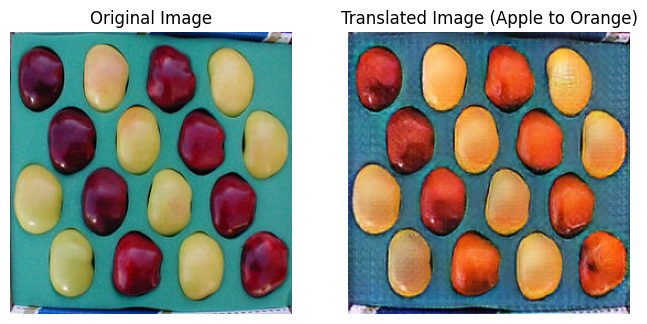

 Plot displayed successfully!


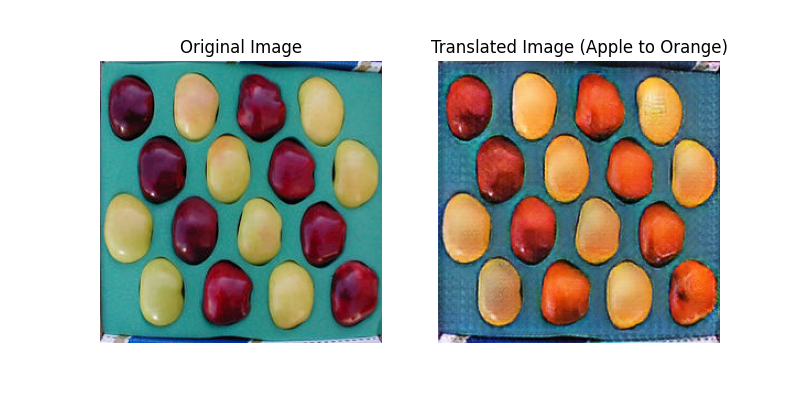

Starting generate_and_plot()...
Loading image from /content/drive/MyDrive/03.BigDataAnalytics/8.Project3/apple2orange/testA/n07740461_11121.jpg
Image loaded successfully with shape: torch.Size([1, 3, 256, 256])
Image translation completed.
Translated image saved at ./apple_to_orange_2.png


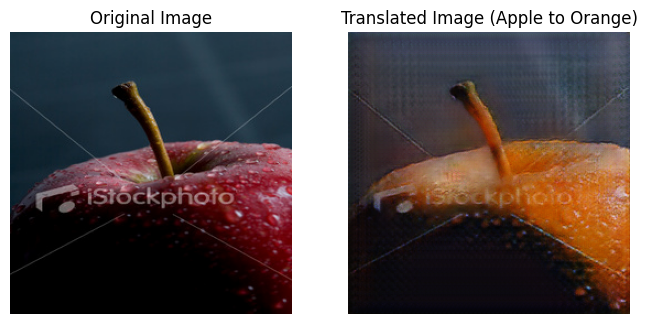

 Plot displayed successfully!


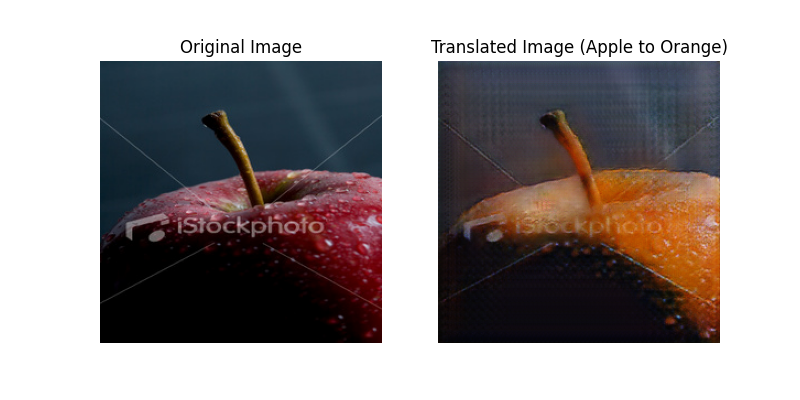

Starting generate_and_plot()...
Loading image from /content/drive/MyDrive/03.BigDataAnalytics/8.Project3/apple2orange/testA/n07740461_490.jpg
Image loaded successfully with shape: torch.Size([1, 3, 256, 256])
Image translation completed.
Translated image saved at ./apple_to_orange_3.png


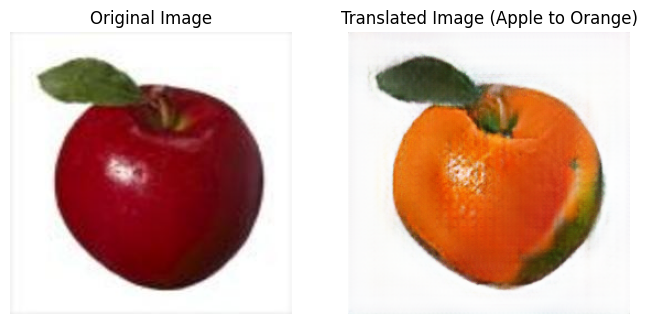

 Plot displayed successfully!


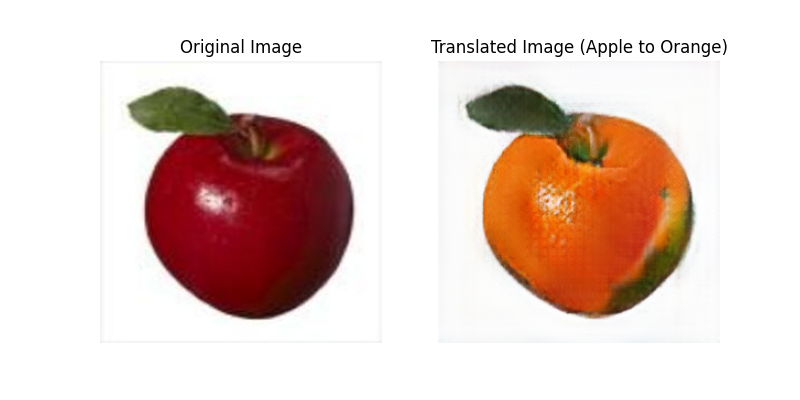

 Translating Orange to Apple...
Starting generate_and_plot()...
Loading image from /content/drive/MyDrive/03.BigDataAnalytics/8.Project3/apple2orange/testB/n07749192_3130.jpg
Image loaded successfully with shape: torch.Size([1, 3, 256, 256])
Image translation completed.
Translated image saved at ./orange_to_apple_1.png


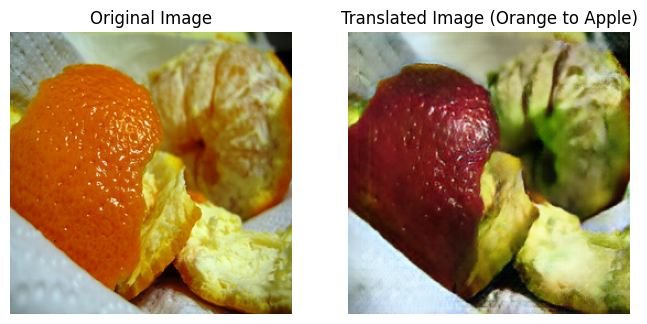

 Plot displayed successfully!


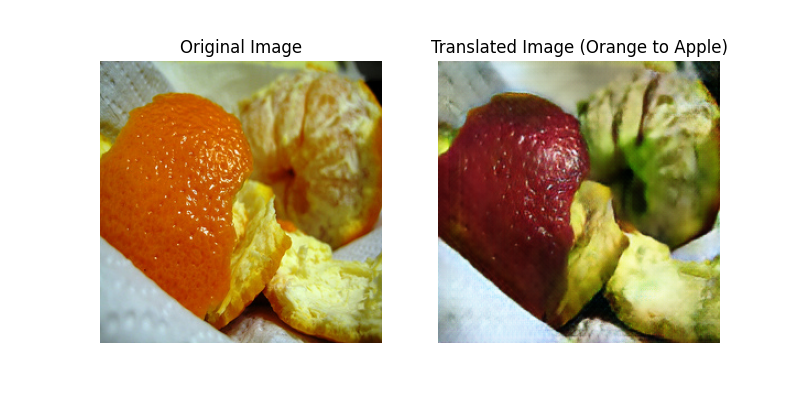

Starting generate_and_plot()...
Loading image from /content/drive/MyDrive/03.BigDataAnalytics/8.Project3/apple2orange/testB/n07749192_1680.jpg
Image loaded successfully with shape: torch.Size([1, 3, 256, 256])
Image translation completed.
Translated image saved at ./orange_to_apple_2.png


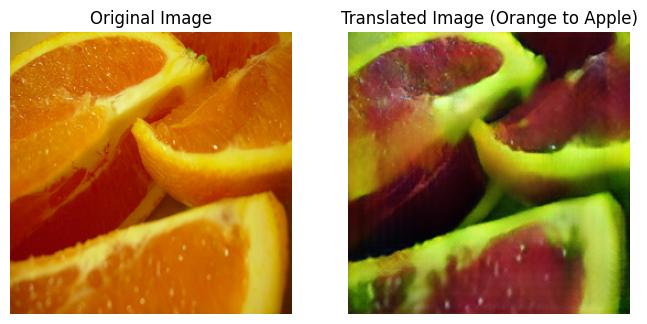

 Plot displayed successfully!


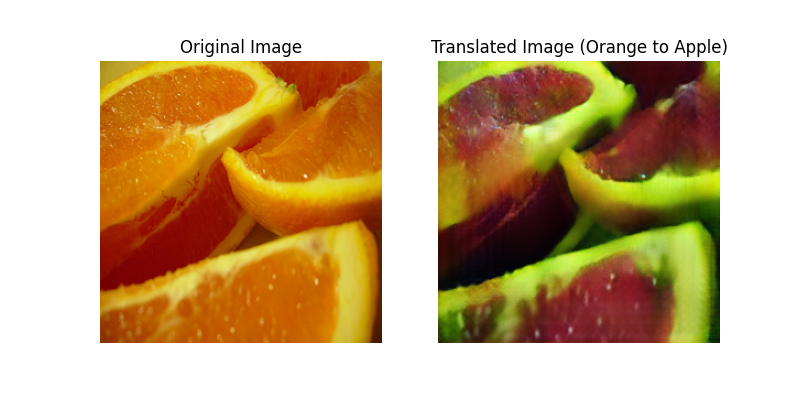

Starting generate_and_plot()...
Loading image from /content/drive/MyDrive/03.BigDataAnalytics/8.Project3/apple2orange/testB/n07749192_12050.jpg
Image loaded successfully with shape: torch.Size([1, 3, 256, 256])
Image translation completed.
Translated image saved at ./orange_to_apple_3.png


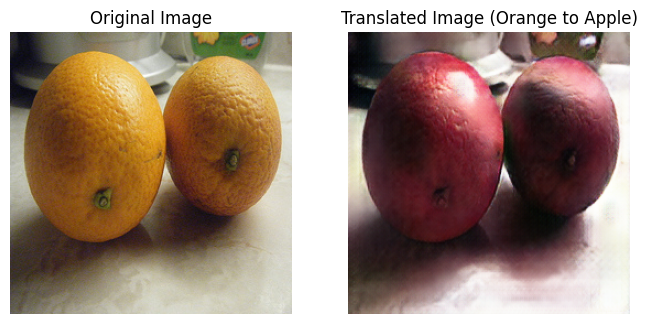

 Plot displayed successfully!


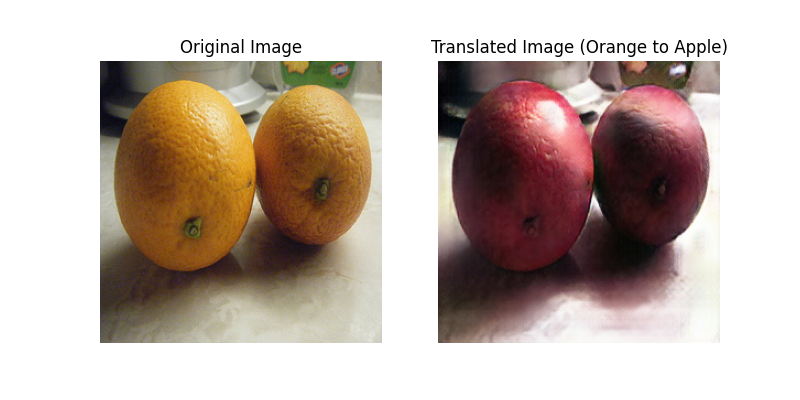

In [ ]:
# -------------------------
# Cell 13: Generate and Plot Multiple Test Images
# -------------------------
import random
import glob
from IPython.display import Image as IPImage, display

# Define test image paths
test_apple_path = "/content/drive/MyDrive/03.BigDataAnalytics/8.Project3/apple2orange/testA/*.jpg"  # Apple to Orange
test_orange_path = "/content/drive/MyDrive/03.BigDataAnalytics/8.Project3/apple2orange/testB/*.jpg"  # Orange to Apple

# Select 5 random images from each test set
apple_images = random.sample(glob.glob(test_apple_path), 3)
orange_images = random.sample(glob.glob(test_orange_path), 3)

# Generate and plot 5 Apple to Orange images
print("Translating Apple to Orange...")
for i, img_path in enumerate(apple_images):
    output_path = f"./apple_to_orange_{i+1}.png"
    generate_and_plot(img_path, G_apple2orange, save_path=output_path, direction="Apple to Orange")

    # Display generated image inline in Colab
    display(IPImage(output_path))

# Generate and plot 5 Orange to Apple images
print(" Translating Orange to Apple...")
for i, img_path in enumerate(orange_images):
    output_path = f"./orange_to_apple_{i+1}.png"
    generate_and_plot(img_path, G_orange2apple, save_path=output_path, direction="Orange to Apple")

    # Display generated image inline in Colab
    display(IPImage(output_path))